import warnings
warnings.filterwarnings('ignore')

In [1]:
import PyHyperScattering
import os
import fabio
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from scipy.interpolate import RectBivariateSpline
from matplotlib.colors import LogNorm
from matplotlib.colorbar import Colorbar as colorbar
from IPython.display import clear_output
try:
    import dask.array as da
    import dask
except ImportError:
    warnings.warn('Failed to import Dask, if Dask reduction desired install pyhyperscattering[performance]',stacklevel=2)

/nsls2/users/pnguyen2/SMI/src/pyhyperscattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


In [2]:
base_data_dirs = '/nsls2/users/pnguyen2/PN_AGBEH_/'

In [3]:
# This snippet is contained within SMIRSoXSLoader and is used for development

In [4]:
def list_files(file_path,include_str):
    files = []
    new_files = []

    new_files = [os.path.join(file_path, file) for file in os.listdir(file_path) if include_str in file]
    files = files + new_files

    files.sort(key = lambda x: os.path.getmtime(x), reverse = False)
    files = pd.Series([os.path.split(path_to_file)[-1] for path_to_file in files])

    return files

# Functions that finds common substrings in list/array of strings
def all_substr( data):
    iteration = 0
    substr = []
    temp = data[:]
    while (len(temp) > 0) and len(long_substr(temp)) > 1:
        iteration += 1
        if iteration <= 1:
            substr += long_substr(data)
            temp = [x.replace(substr[-1], '') for x in data]
        else:
            temp = [x.replace(substr[-1], '') for x in temp]
            substr += long_substr(temp)
    # return pd.Series(substr).unique().tolist()
    return substr

def long_substr( data):
    substr = []
    if len(data) > 0 and len(data[0]) > 0:
        for i in range(len(data[0])):
            for j in range(len(data[0]) - i + 1):
                if j >= len(substr) and is_substr(data[0][i:i + j], data):
                    substr.append(data[0][i:i + j])   
    return substr

def is_substr( find, data):
    if len(data) < 1 and len(find) < 1:
        return False
    for i in range(len(data)):
        if find not in data[i]:
            return False
    return True
# end of functions that finds common substrings in list/array of strings

def find_substring_in_filenames( list_of_uniques, substring):
    str_pos_in_filenames = []
    for i, list_of_unique in enumerate(list_of_uniques):
        for item in all_substr(list_of_unique):
                if substring in item:
                    str_pos_in_filenames.append(i)
    if len(str_pos_in_filenames) >= 1:
        print(f'Field(s) {str_pos_in_filenames} in the filenames contain {substring}.')
        return pd.Series(str_pos_in_filenames).unique().tolist()
    else:
        print(f'No part of the file names contain {substring}. Here are all the substrings that will work. Substrings of these substrings also work:')
        list_of_strings = []
        for list_of_unique in list_of_uniques:
            list_of_strings.append(all_substr(list_of_unique))
        print(pd.Series(list_of_strings))

In [5]:
pol_strs = ['-rot']
pols = [90]
remove_tail = '_xxxx.xxeV_qmap_Intensity.tif'
remove_strs = ['PN_']

In [6]:
config = {}

files = list_files(base_data_dirs, include_str = '_qmap_Intensity')
Qx_files = list_files(base_data_dirs, include_str = '_qmap_qhor')
Qy_files = list_files(base_data_dirs, include_str = '_qmap_qver')

# Make a list of an arbitrary number of lists (determined by the number of strings in the file name separated by '_')
file_name_strs = []
del file_name_strs
file_name_strs = []

for item in files[0].split('_'):
    file_name_strs.append([])

# Go through all the files and append entries from different filenames into the lists generated above
# assumes that the info in each string separated by '_' is consistent in placement in the file name for all files
for file in files:
    for i, item in enumerate(file.split('_')):
        file_name_strs[i].append(item)

#define all the all_energies available from the files loaded: 
all_energies = np.sort(file_name_strs[find_substring_in_filenames(file_name_strs, 'eV')[0]])

energies = []
for i, energy in enumerate(all_energies):
    energies.append(float(''.join(c for c in energy if (c.isdigit() or c == '.'))))

config['energy'] = pd.Series(energies).unique()

elist = config['energy']
num_energies = len(elist)

max_range_Qx = None
max_range_Qy = None

for i, e in enumerate(elist):
    if e == np.max(elist):
        max_range_Qx = np.loadtxt((f'{base_data_dirs}' + Qx_files[i]), comments='#', delimiter=None, skiprows=1)
        max_range_Qy = np.loadtxt((f'{base_data_dirs}' + Qy_files[i]), comments='#', delimiter=None, skiprows=1)

outlist = []
for i, e in enumerate(elist):

    image = np.fliplr(np.flipud(np.rot90(fabio.open(f'{base_data_dirs}' + files[i]).data)))
    
    NumX, NumY = image.shape

    Qx = np.loadtxt((f'{base_data_dirs}' + Qx_files[i]), comments='#', delimiter=None, skiprows=1)
    Qy = np.loadtxt((f'{base_data_dirs}' + Qy_files[i]), comments='#', delimiter=None, skiprows=1)
    
    qx_new = np.linspace(np.nanmin(max_range_Qx), np.nanmax(max_range_Qx), num=NumX)
    qy_new = np.linspace(np.nanmin(max_range_Qy), np.nanmax(max_range_Qy), num=NumY)
    
    interpolator = RectBivariateSpline(Qx, Qy, image)
    img = interpolator(qx_new, qy_new)
    
    outlist.append(img)
data = da.stack(outlist,axis=2)

config['sample_name'] = files[0][:-len(remove_tail)]
for remove_str in remove_strs:
    config['sample_name'] = config['sample_name'].replace(remove_str, '')
    
config['sampleid'] = config['sample_name']

for i, pol_str in enumerate(pol_strs):
    if pol_str in config['sample_name']:
        config['polarization'] = pols[i]
    else:
        config['polarization'] = 0
    
if np.nanmax(Qx) > 1 or np.nanmax(Qy) > 1:
    config['rsoxs_config'] = 'waxs'
else:
    config['rsoxs_config'] = 'saxs'

raw = xr.DataArray(data, dims=("qx", "qy", "energy"), coords={"qy":qy_new, "qx":qx_new, "energy":elist},attrs=config).rename(config['sample_name'])

Field(s) [2] in the filenames contain eV.


In [7]:
raw

<xarray.DataArray 'AGBEH' (qx: 1962, qy: 1140, energy: 40)>
dask.array<stack, shape=(1962, 1140, 40), dtype=float64, chunksize=(1962, 1140, 1), chunktype=numpy.ndarray>
Coordinates:
  * qy       (qy) float64 -0.1715 -0.1707 -0.1698 ... 0.8209 0.8218 0.8227
  * qx       (qx) float64 -0.2395 -0.2386 -0.2377 -0.2368 ... 1.469 1.47 1.47
  * energy   (energy) float64 2.46e+03 2.465e+03 2.47e+03 ... 2.495e+03 2.5e+03
Attributes:
    energy:        [2460.  2465.  2470.  2471.  2472.  2473.  2473.5 2474.  2...
    sample_name:   AGBEH
    sampleid:      AGBEH
    polarization:  0
    rsoxs_config:  waxs

In [8]:
integ = PyHyperScattering.integrate.WPIntegrator()
remeshed = integ.integrateImageStack(raw)

  0%|          | 0/40 [00:00<?, ?it/s]

In [9]:
cmap = mpl.cm.viridis
cmap.set_bad((68/255, 1/255, 84/255), 1)

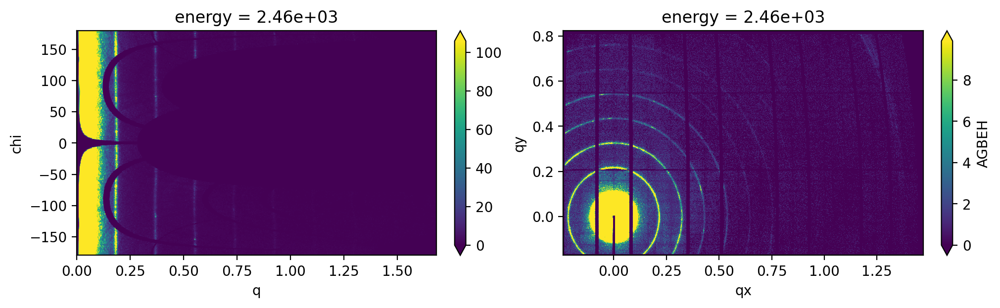

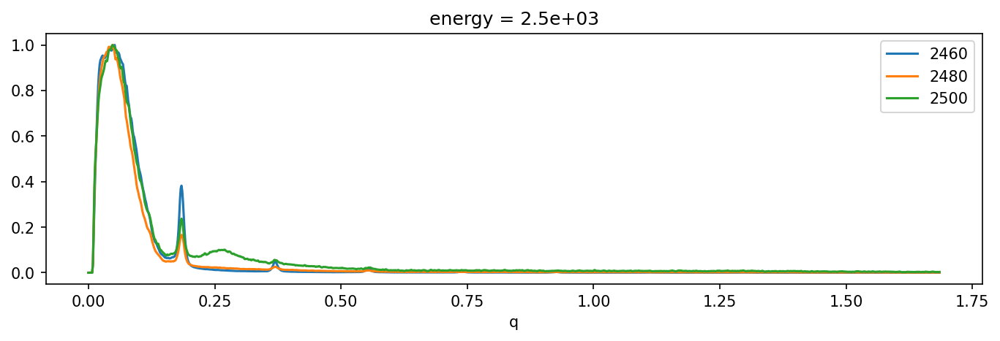

In [10]:
energy = 2460
fig, ax = plt.subplots(1,2,figsize=(10,3),dpi=200,constrained_layout=True)
remeshed.sel(energy=energy).plot(cmap = cmap,ax = ax[0], vmin = 0, vmax = np.nanpercentile(remeshed.sel(energy=energy),95))
ax[0].set_xlim([0, np.nanmax(remeshed.q)])
ax[0].set_ylim([np.nanmin(remeshed.chi), np.nanmax(remeshed.chi)])
raw.sel(energy=energy).plot(x = 'qx', y = 'qy',cmap = cmap, ax = ax[1], vmin = 0, vmax = np.nanpercentile(raw.sel(energy=energy),97.5))
plt.show()

fig, ax = plt.subplots(1,1,figsize=(9,3),dpi=150,constrained_layout=True)
(remeshed.sel(energy=2460).mean('chi')/np.max(remeshed.sel(energy=2460).mean('chi'))).plot(label = '2460')
(remeshed.sel(energy=2480).mean('chi')/np.max(remeshed.sel(energy=2480).mean('chi'))).plot(label = '2480')
(remeshed.sel(energy=2500).mean('chi')/np.max(remeshed.sel(energy=2500).mean('chi'))).plot(label = '2500')
plt.legend()
plt.show()

In [11]:
# This snippet is uses the SMIRSoXSLoader to demonstrate data loading using the same directory as above

In [12]:
file_loader = PyHyperScattering.load.SMIRSoXSLoader()
raw = file_loader.loadDirectory(base_data_dirs, pol_strs = ['-rot'], pols = [90], remove_tail = '_xxxx.xxeV_qmap_Intensity.tif', remove_strs = ['PN_'])
raw

Field(s) [2] in the filenames contain eV.
Finished reading 40 energies. Time required: 0:00:08.373738


<xarray.DataArray 'AGBEH' (qx: 1962, qy: 1140, energy: 40)>
dask.array<stack, shape=(1962, 1140, 40), dtype=float64, chunksize=(1962, 1140, 1), chunktype=numpy.ndarray>
Coordinates:
  * qy       (qy) float64 -0.1715 -0.1707 -0.1698 ... 0.8209 0.8218 0.8227
  * qx       (qx) float64 -0.2395 -0.2386 -0.2377 -0.2368 ... 1.469 1.47 1.47
  * energy   (energy) float64 2.46e+03 2.465e+03 2.47e+03 ... 2.495e+03 2.5e+03
Attributes:
    energy:        [2460.  2465.  2470.  2471.  2472.  2473.  2473.5 2474.  2...
    sample_name:   AGBEH
    sampleid:      AGBEH
    polarization:  0
    rsoxs_config:  waxs

In [13]:
remeshed = integ.integrateImageStack(raw)

  0%|          | 0/40 [00:00<?, ?it/s]

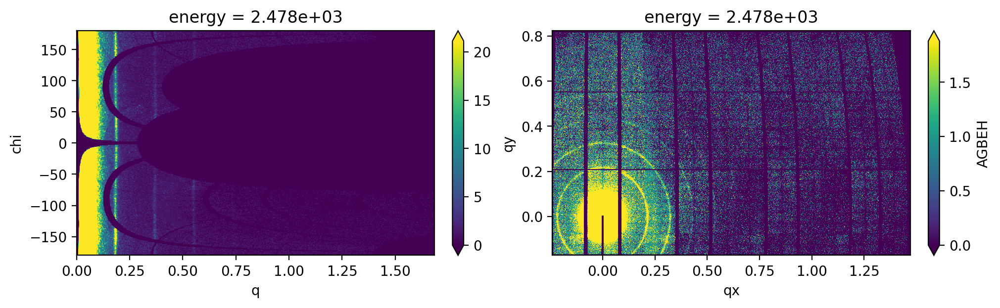

In [14]:
energy = 2478
fig, ax = plt.subplots(1,2,figsize=(10,3),dpi=200,constrained_layout=True)
remeshed.sel(energy=energy).plot(cmap = cmap,ax = ax[0], vmin = 0, vmax = np.nanpercentile(remeshed.sel(energy=energy),95))
raw.sel(energy=energy).plot(x = 'qx', y = 'qy', cmap = cmap, ax = ax[1], vmin = 0, vmax = np.nanpercentile(raw.sel(energy=energy),95))

ax[0].set_ylim([-180, 180])
ax[0].set_xlim([np.nanmin(remeshed.q), np.nanmax(remeshed.q)])
plt.show()

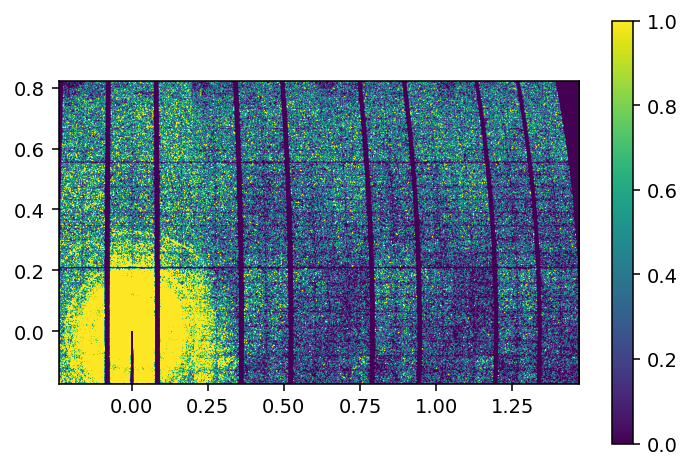

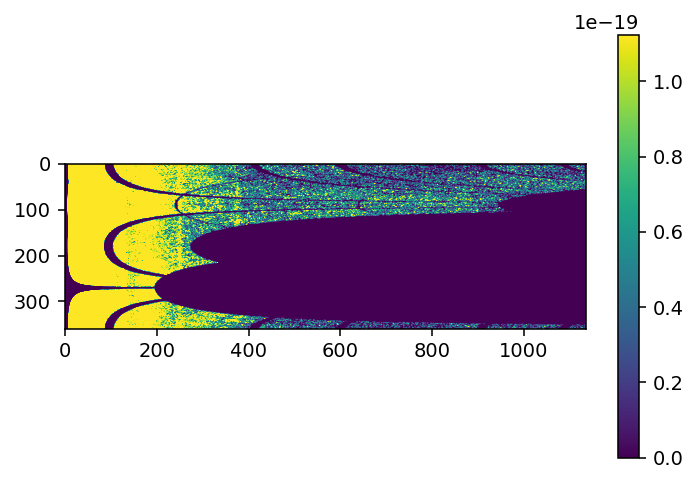

In [16]:
import skimage

img = fabio.open('/nsls2/users/pnguyen2/PN_AGBEH_/PN_AGBEH_2500.00eV_qmap_Intensity.tif').data
q_hor = np.loadtxt('/nsls2/users/pnguyen2/PN_AGBEH_/PN_AGBEH_2500.00eV_qmap_qhor.txt', comments='#', delimiter=None, skiprows=1)
q_ver = np.loadtxt('/nsls2/users/pnguyen2/PN_AGBEH_/PN_AGBEH_2500.00eV_qmap_qver.txt', comments='#', delimiter=None, skiprows=1)

fig, ax = plt.subplots(dpi = 140)
im = ax.imshow(img, extent=[q_hor[0], q_hor[-1], q_ver[0], q_ver[-1]], cmap = cmap, vmin = 0, vmax = np.nanpercentile(img,95))
plt.colorbar(im, ax=ax)

center_x = float(xr.DataArray(np.linspace(0,len(q_hor)-1,len(q_hor)))
            .assign_coords({'dim_0':q_hor})
            .rename({'dim_0':'qx'})
            .interp(qx=0)
            .data)
center_y = float(xr.DataArray(np.linspace(0,len(q_ver)-1,len(q_ver)))
            .assign_coords({'dim_0':q_ver})
            .rename({'dim_0':'qy'})
            .interp(qy=0)
            .data)  
warped_img = skimage.transform.warp_polar(np.flipud(img),center=(center_y,center_x))

fig, ax = plt.subplots(dpi = 140)
im = ax.imshow(warped_img, cmap = cmap, vmin = 0, vmax = np.nanpercentile(warped_img,85))
plt.colorbar(im, ax=ax)